# Kalman Filters

This script explores **Kalman filter variants** for robot localization, including:
- **Extended Kalman Filter (EKF)** with both known and unknown landmark correspondences
- **Unscented Kalman Filter (UKF)** for nonlinear state estimation


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from matplotlib.animation import FuncAnimation
from util import *

### The Map
---

#### **Landmark Map Representation**

The localization process assumes:
- A **predefined map** of landmarks with known positions
- A **sensor system** capable of:
  - Detecting landmarks in the environment
  - Establishing **known correspondences** between detected landmarks and their map representations

The landmark map is structured as a collection of individual landmarks, where each landmark $L_i$ is defined by:

$$
L_i = (x_l, y_l, s_l)
$$

with $(x_l, y_l)$ being the cartesian coordinates representing the landmark's position in the global reference frame and $s_l$ the unique signature/identifier corresponding to the landmark's index in the map

Each landmark's signature $s_l$ enables the sensor to:
1. Unambiguously identify detected landmarks
2. Establish direct correspondences with map entries
3. Facilitate precise measurement updates in the EKF framework

This known correspondence assumption simplifies the data association problem, allowing the EKF to focus on state estimation rather than landmark identification.


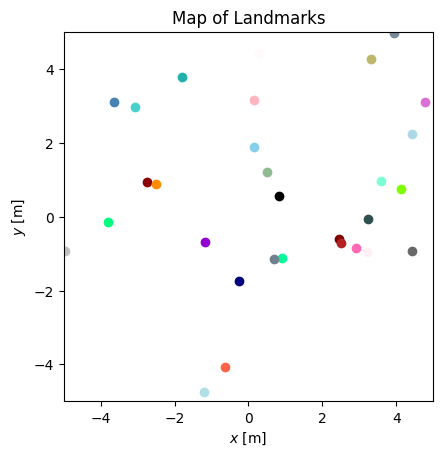

In [2]:
# create map
n_landmarks = 30

x_roi = (-5, 5)
y_roi = (-5, 5)

landmarks = []
for signature in range(n_landmarks):
    #sample coordinates in roi
    x = np.random.uniform(x_roi[0], x_roi[1])
    y = np.random.uniform(y_roi[0], y_roi[1])
    phi = Angle.from_radians(np.random.uniform(0, 2 * np.pi))
    #create landmark
    landmarks.append(Landmark(Pose(x, y, phi), signature))

landmark_map = LandmarkMap(landmarks)

#plot map
f, ax = plt.subplots()

ax.set_xlim(x_roi)
ax.set_ylim(y_roi)
ax.set_title("Map of Landmarks")
ax.set_xlabel("$x$ [m]")
ax.set_ylabel("$y$ [m]")
ax.set_aspect('equal', adjustable='box')

landmark_map.draw(ax)

### Sensor and Robot System Architecture

---
#### **Sensor Model**

The simulation implements a **camera sensor** with the following characteristics:

- **Field of View (FoV)** defined by:
  - Angular width: $\theta_{FoV}$
  - Maximum detection range: $r_{FoV}$

- **Detection Probability**:\
Landmarks within the FoV are detected with probability that decreases linearly from the center line of the detection cone

- **Feature Measurement**:\
For each detected landmark, the sensor computes a feature vector in **sensor frame**: $z_s = (r_{sf}, \phi_{sf}, s_f)$ where $r_{sf}$ is the distance from sensor to landmark, $\phi_{sf}$ the bearing angle from sensor to landmark and $s_f$ the landmark signature/identifier

- **Frame Transformation**:\
Detected features are transformed to the **robot's reference frame**:$z_r = (r_{rf}, \phi_{rf}, s_f)$ where $r_{rf}$ and $\phi_{rf}$ are relative to the robot's pose

- **Sensor Placement**:\
The sensor's position and orientation relative to the robot is defined by the `sensor_pose` variable
---
#### **Robot System**

The robot class provides a **high-level abstraction** for:

- **Motion Control**:
  - Handles simulation of robot movement based on control inputs

- **Sensor Integration**:
  - Uses the map environment to generate sensor readings
  - Manages registered sensors and their positions relative to the robot
  - Provides sensor data in the robot's reference frame

- **Simulation Interface**:
  - Encapsulates all low-level operations
  - Provides clean APIs for control and sensing
  - Maintains the robot's state and coordinates sensor operations


In [3]:
#robot's initial position
robot_pose  = Pose(0, 0, Angle(180))
sensor_pose = Pose(0.5, 0, Angle(0))
th_fov = Angle(60) #[°]
sensor_range = 5 #[m]

#define robot's sensor
sensors = [
    CameraSensor(sensor_pose, th_fov, robot_pose=robot_pose, range=sensor_range)
]

robot = Robot(robot_pose, sensors, landmark_map)

def resetRobot():
    robot.updatePosition(robot_pose)

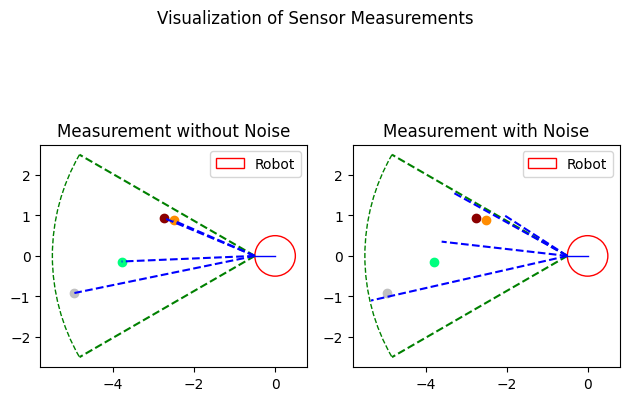

In [4]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.suptitle("Visualization of Sensor Measurements")

ax1.set_title("Measurement without Noise")
sensor_readings = robot.getSensorReadings(detection_noise=False) 
deteced_features = sensor_readings[0][0]
correspondences = sensor_readings[0][1]

landmark_map.draw(ax1, correspondences)
robot.draw(ax1, label="Robot", draw_sensor_readings=True)

ax2.set_title("Measurement with Noise")
sensor_readings = robot.getSensorReadings(detection_noise=True) 
deteced_features = sensor_readings[0][0]
correspondences = sensor_readings[0][1]

landmark_map.draw(ax2, correspondences)
robot.draw(ax2, label="Robot", draw_sensor_readings=True)

plt.tight_layout()


### Velocity Control in Differential-Drive Robotics

---

#### **Control Input Structure**

The simulation employs **velocity control** for the differential-drive robot, where each control input is defined as:

$$
\vec{u} = (v, \omega, \Delta t)
$$

where $v$ is linear velocity (m/s), $\omega$ the angular velocity (rad/s) and $\Delta t$ the integration time interval (s)

---

#### **State Transition Function**

The transfer function describes how the robot's state $\vec{x} = [x, y, \theta]^T$ evolves for a given control input $\vec{u}$:

#### General Case ($\omega \neq 0$)

For non-zero angular velocity, the state transition follows circular arc motion:

$$
\text{TF}(\vec{u}, \vec{x}) =
\begin{bmatrix}
x_k \\
y_k \\
\theta_k
\end{bmatrix}
=
\begin{bmatrix}
x_{k-1} + \frac{v}{\omega} \left[ \sin(\theta_{k-1} + \omega \Delta t) - \sin(\theta_{k-1}) \right] \\
y_{k-1} + \frac{v}{\omega} \left[ -\cos(\theta_{k-1} + \omega \Delta t) + \cos(\theta_{k-1}) \right] \\
\theta_{k-1} + \omega \Delta t
\end{bmatrix}
$$

#### Special Case ($\omega = 0$)

When the angular velocity is zero, the robot moves in a straight line:

$$
\text{TF}(\vec{u}, \vec{x}) =
\begin{bmatrix}
x_k \\
y_k \\
\theta_k
\end{bmatrix}
=
\begin{bmatrix}
x_{k-1} + v \cos(\theta_{k-1}) \Delta t \\
y_{k-1} + v \sin(\theta_{k-1}) \Delta t \\
\theta_{k-1}
\end{bmatrix}
$$

---

#### **Jacobian Computations**

The implementation includes methods to compute the Jacobian matrices required by the Extended Kalman Filter (EKF):

1. **State Transition Jacobian** $G$:
   $$
   G(\vec{u}, \vec{x}) = \frac{\partial \text{TF}(\vec{u}, \vec{x})}{\partial \vec{x}}
   $$

2. **Control Input Jacobian** $V$:
   $$
   V(\vec{u}, \vec{x}) = \frac{\partial \text{TF}(\vec{u}, \vec{x})}{\partial \vec{u}}
   $$

These Jacobians are then used to propagate uncertainty through the state transition, incorporating control input noise in the EKF prediction step
while linearizing the non-linear motion model for the EKF framework.


In [5]:
dt = 1 #[s]
angular_velocity = -1 #[rad/s]
linear_velocity = 1 #[m/s]

u = VelocityControl(linear_velocity, angular_velocity, dt)

### Kalman Filter for Robot Localization

The Extended Kalman Filter (EKF) is designed to **localize a robot** by maintaining and updating two key parameters at each timestep $k$:

1. **State Estimate** $\vec{\mu}_k$: The robot's estimated pose (position and orientation).
2. **Uncertainty** $\Sigma_k$: The covariance matrix encoding the uncertainty of the state estimate.

---
#### **Initialization**

The EKF is initialized with:
- **Initial pose** $\vec{\mu}_0 = \vec{x}_0$ (the robot's starting position and orientation).
- **Initial covariance matrix** $\Sigma_0$, representing the initial uncertainty. A common choice is an identity matrix, assuming equal and independent uncertainty in all dimensions:

$$
\Sigma_0 = \begin{bmatrix}
1 & 0 & 0 \\
0 & 1 & 0 \\
0 & 0 & 1
\end{bmatrix}
$$

---

#### **Prediction Steps**

The EKF prediction process consists of two main phases:

##### **1. Odometry Prediction**

The **odometry prediction step** updates the robot's state estimate and uncertainty based on control inputs (linear and angular velocities):

- **State Transition**: The robot's pose is updated using the control input $\vec{u}$ (linear velocity $v$ and angular velocity $\omega$).
- **Uncertainty Propagation**: The covariance matrix is updated to reflect the increased uncertainty due to motion noise. This involves:
  - **State transition Jacobian** $G$: Linearizes the motion model with respect to the state.
  - **Control noise Jacobian** $V$: Linearizes the motion model with respect to control noise.
  - **Process noise covariance** $M$: Models the noise in the control input, scaled by coefficients $\alpha_1,\alpha_2, \alpha_3, \alpha_4$.

The updated state $\hat{\vec{\mu}}$ and covariance $\hat{\Sigma}$ are computed as:

$$
\hat{\vec{\mu}} = g(\vec{\mu}_{k-1}, \vec{u})
$$

$$
\hat{\Sigma} = G \Sigma_{k-1} G^T + V M V^T
$$

##### **2. Measurement Update**

The **measurement update step** refines the state estimate using sensor observations of landmarks. There are two variants:

##### 2.a. Known Correspondence

When the correspondence between detected landmarks and the map is known:
- For each detected landmark $z_i$ and its corresponding map landmark $c_i$:
  - Compute the **expected measurement** $\hat{z}_i$ based on the current state estimate.
  - Linearize the measurement model using the **measurement Jacobian** $H$.
  - Compute the **Kalman gain** $K$ to weigh the prediction and measurement.
  - Update the state estimate and covariance using the measurement residual.

**Note:** The Kalman gain determines how much to trust the prediction versus the measurement, balancing the two to minimize uncertainty.

The update equations are:


$$K = \hat{\Sigma} H^T (H \hat{\Sigma} H^T + Q)^{-1}$$

$$\vec{\mu}_k = \hat{\vec{\mu}} + K (z_i - \hat{z}_i)$$


$$\Sigma_k = (I - K H) \hat{\Sigma}$$

where $Q$ is the measurement noise covariance.

##### 2.b. Unknown Correspondence

When correspondences are unknown, the EKF evaluates all possible landmark associations:
- For each detected landmark $z_i$, find the map landmark that maximizes the likelihood $p(z_i | \vec{\mu}, \Sigma)$.
- Use the best association to update the state estimate and covariance, similar to the known correspondence case.

--- 

The EKF iteratively applies these steps, providing a robust estimate of the robot's pose and uncertainty over time.


In [6]:
def initializeEkf(initial_sigma: np.array = np.array([[1, 0, 0],[0, 1, 0], [0, 0, 1]])) -> Ekf:
    return Ekf(robot.pos, initial_sigma)

### EKF with Known Correspondence

This section examines the Extended Kalman Filter (EKF) implementation for robot localization when **landmark correspondences are known**.

---

#### **EKF Prediction Steps: Visualization**

The following plots illustrate the EKF prediction process for a given control input:

- **1. Robot's Initial Position (`ax1`)** \
Shows the robot's starting pose together with the initial estimate and the landmark map.

- **2. Robot's Position After Command (`ax2`)** \
Compares the **expected** (noise-free) and **actual** (noisy) robot positions after applying a control input $\vec{u}$.

- **3. EKF Odometry Prediction (`ax3`)** \
Shows the robot's state after the **odometry-based prediction step** (no sensor data is considered at this stage).

- **4. EKF Prediction Refinement (`ax4`)**\
Shows the robot's state after incorporating **sensor readings** (i.e. the observed landmarks).\
**Note:** some of the landmarks in the sensor's FOV may remain undetected!



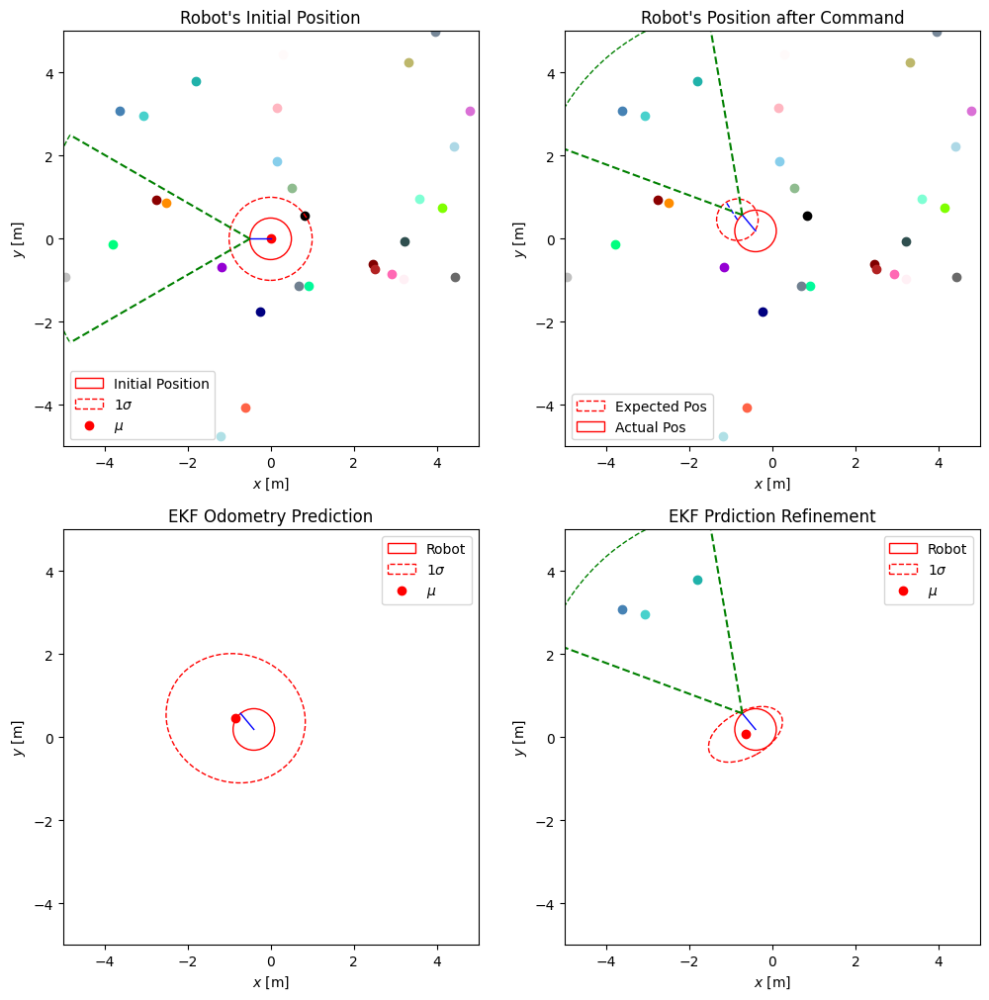

In [7]:
resetRobot()
ekf = initializeEkf()

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))
### --- AX1
ax1.set_title("Robot's Initial Position")
ax1.set_xlim(x_roi)
ax1.set_ylim(y_roi)
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")

landmark_map.draw(ax1)
robot.draw(ax1, label="Initial Position")
ekf.draw(ax1, n_sigmas=1)

### --- AX2
ax2.set_title("Robot's Position after Command")
ax2.set_xlim(x_roi)
ax2.set_ylim(y_roi)
ax2.set_xlabel("$x$ [m]")
ax2.set_ylabel("$y$ [m]")

landmark_map.draw(ax2)

robot.applyControl(u, motion_noise=False)
robot.draw(ax2, label="Expected Pos", linestyle='--', draw_sensor=False)

resetRobot()

robot.applyControl(u)
robot.draw(ax2, label="Actual Pos")
### --- AX3
ax3.set_title("EKF Odometry Prediction")
ax3.set_xlim(x_roi)
ax3.set_ylim(y_roi)
ax3.set_xlabel("$x$ [m]")
ax3.set_ylabel("$y$ [m]")

ekf.predictOdometry(u)
robot.draw(ax3, label="Robot", draw_sensor=False)
ekf.draw(ax3, n_sigmas=1)

### --- AX4
ax4.set_title("EKF Prdiction Refinement")
ax4.set_xlim(x_roi)
ax4.set_ylim(y_roi)
ax4.set_xlabel("$x$ [m]")
ax4.set_ylabel("$y$ [m]")

sensor_readings = robot.getSensorReadings() 
deteced_features = sensor_readings[0][0]
correspondences = sensor_readings[0][1]

ekf.predictKnownCorrespondence(deteced_features, correspondences, landmark_map)

landmark_map.draw(ax4, correspondences)
robot.draw(ax4, label="Robot")
ekf.draw(ax4, n_sigmas=1)



---
#### **Robot Localization Animation**

This visualization demonstrates the Extended Kalman Filter (EKF) in action as the robot follows a randomly generated trajectory.

From the animation the following observations can be made:
- The uncertainty increases with movement
- The uncertainty only decreases when a landmark is detected


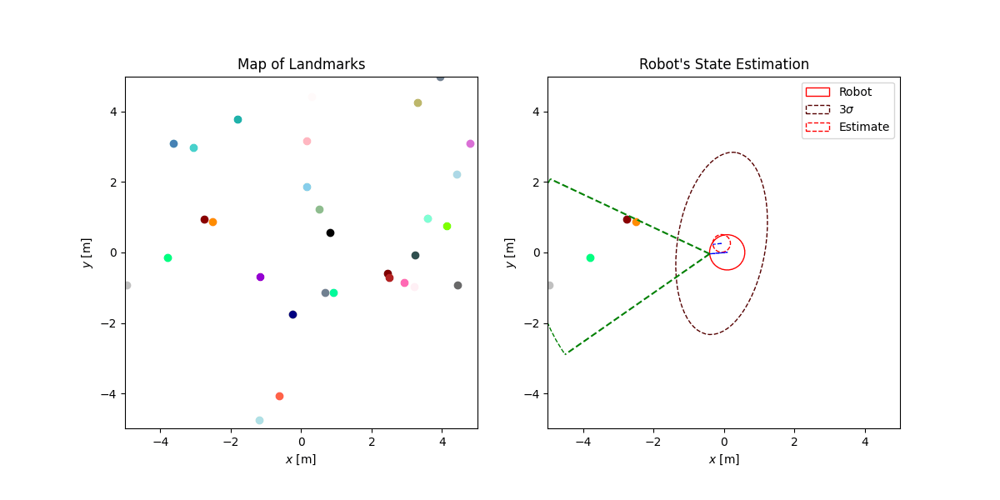

In [8]:
resetRobot()
ekf = initializeEkf()

dt = 0.05
animation_time = 20 #[s]

n_frames = int(animation_time / dt)
trajectory = generateRandomVelocityTrajectory(n_frames,dt)
applied_controls = []

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

landmark_map.draw(ax1)
ax1.set_aspect('equal', adjustable='box')
ax1.set_title("Map of Landmarks")
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")
#update function for animation
def update(frame):
    global applied_controls
    ax2.clear()
    
    u = trajectory[frame]

    applied_controls.append(robot.applyControl(u))

    sensor_readings = robot.getSensorReadings() 
    deteced_features = sensor_readings[0][0]
    correspondences = sensor_readings[0][1]

    ekf.predictOdometry(u)  
    ekf.predictKnownCorrespondence(deteced_features, correspondences, landmark_map)

    ax1.set_xlim(x_roi)
    ax1.set_ylim(y_roi)

    ax2.set_xlim(x_roi)
    ax2.set_ylim(y_roi)
    ax2.set_title("Robot's State Estimation")
    ax2.set_xlabel("$x$ [m]")
    ax2.set_ylabel("$y$ [m]")

    landmark_map.draw(ax2, correspondences=correspondences)
    robot.draw(ax2, label = "Robot")
    ekf.draw(ax2, n_sigmas=3, draw_all_sigma=False, draw_mu=False)
    
    pos = robot.pos
    robot.updatePosition(ekf.mu)
    robot.draw(ax2, label = "Estimate", linestyle='--', draw_sensor=False, r=0.25)
    robot.updatePosition(pos)

ani = FuncAnimation(fig, update, frames=np.arange(0, n_frames), interval=50)

gif_path = 'img/3/knownCorr.gif'
ani.save(gif_path, writer='pillow', fps=20)

plt.close(fig)

display(Image(filename=gif_path))


---
#### **Velocity Trajectory Analysis**

This visualization compares the commanded velocities with the effectively applied velocities throughout the simulation:

The two subplots show the time evolution of the linear velocity (v) in the top plot and the angular velocity (ω) in the bottom plot. Each plot displays:
  - **Commanded velocities**: The ideal velocities sent to the robot
  - **Applied velocities**: The actual velocities achieved (with noise)

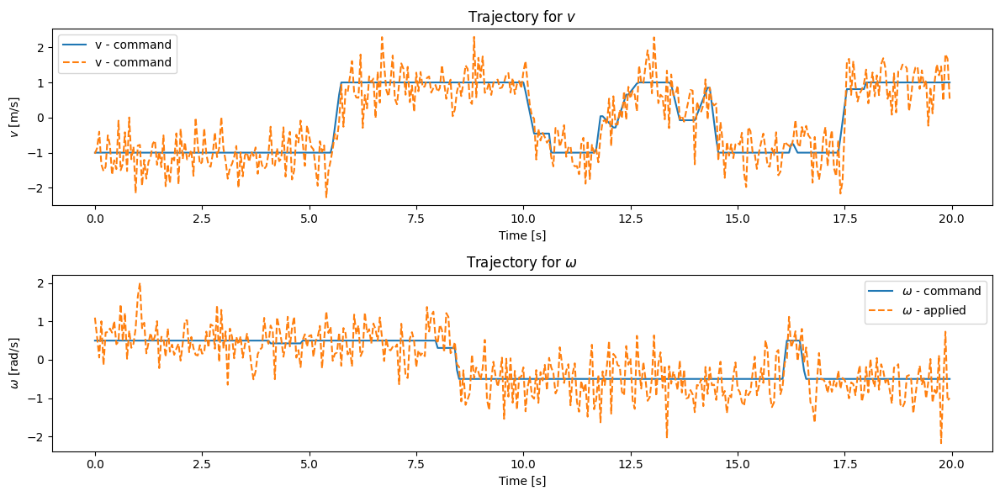

In [9]:
v_traj= []
w_traj = []
v_eff_traj = []
w_eff_traj = []
t_traj = []

t = 0
for u, u_eff in zip(trajectory, applied_controls):
    t_traj.append(t)
    v_traj.append(u.v)
    w_traj.append(u.w) 
    v_eff_traj.append(u_eff.v) 
    w_eff_traj.append(u_eff.w) 
    t += dt

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))
ax1.set_title("Trajectory for $v$")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel(r"$v$ [m/s]")

ax2.set_title("Trajectory for $\\omega$")
ax2.set_xlabel("Time [s]")
ax2.set_ylabel(r"$\omega$ [rad/s]")

ax1.plot(t_traj, v_traj, label="v - command")
ax1.plot(t_traj, v_eff_traj, linestyle='--', label="v - command")
ax1.legend()

ax2.plot(t_traj, w_traj, label="$\\omega$ - command")
ax2.plot(t_traj, w_eff_traj, linestyle='--', label="$\\omega$ - applied")
ax2.legend()
plt.tight_layout()


### EKF with Unknown Correspondence

This section examines the Extended Kalman Filter (EKF) implementation for robot localization when **landmark correspondences are not known**.

---

#### **EKF Prediction Steps: Visualization**

The following plots illustrate the EKF prediction process for a given control input:

- **1. Robot's Initial Position (`ax1`)** \
Shows the robot's starting pose together with the initial estimate and the landmark map.

- **2. Robot's Position After Command (`ax2`)** \
Compares the **expected** (noise-free) and **actual** (noisy) robot positions after applying a control input $\vec{u}$.

- **3. EKF Odometry Prediction (`ax3`)** \
Shows the robot's state after the **odometry-based prediction step** (no sensor data is considered at this stage).

- **4. EKF Prediction Refinement (`ax4`)**\
Shows the robot's state after incorporating **sensor readings** (i.e. the observed landmarks).\
**Note:** some of the landmarks in the sensor's FOV may remain undetected!



In [10]:
dt = 1 #[s]
angular_velocity = -1 #[rad/s]
linear_velocity = 1 #[m/s]

u = VelocityControl(linear_velocity, angular_velocity, dt)

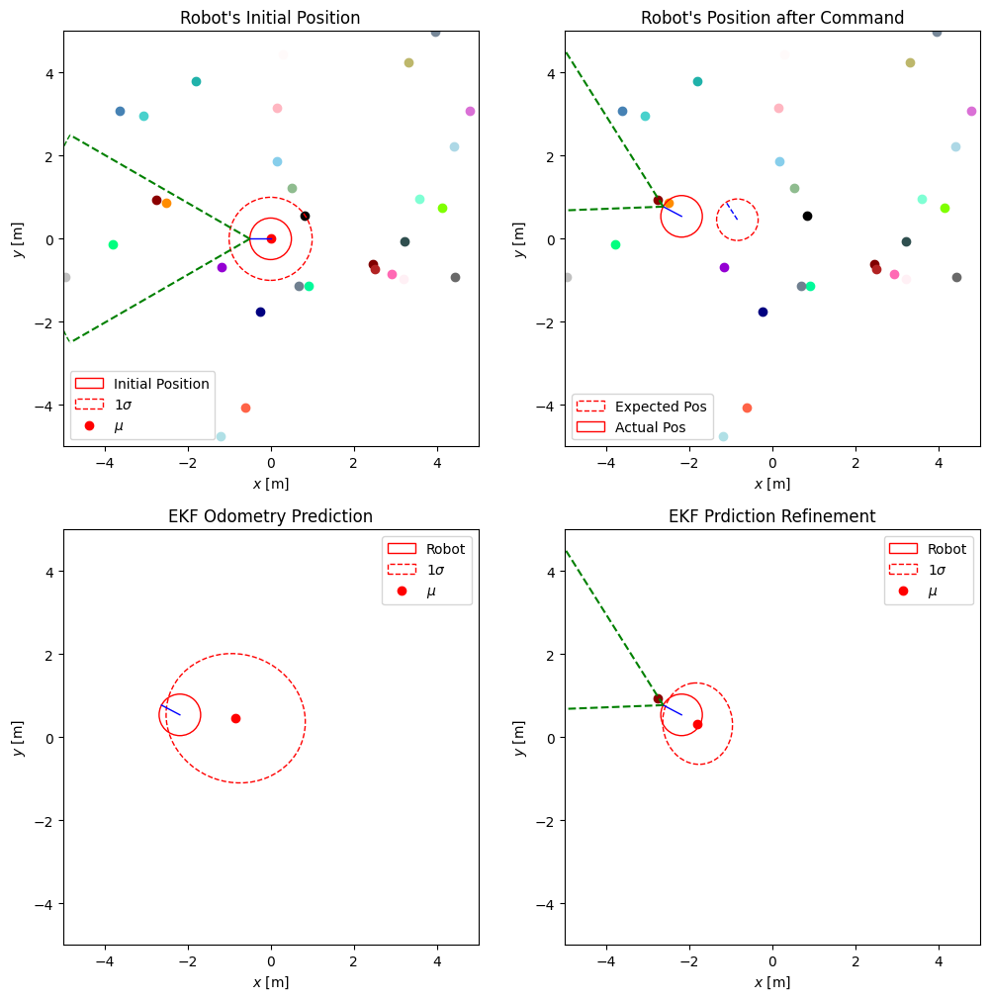

In [11]:
resetRobot()
ekf = initializeEkf()

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))
### --- AX1
ax1.set_title("Robot's Initial Position")
ax1.set_xlim(x_roi)
ax1.set_ylim(y_roi)
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")

landmark_map.draw(ax1)
robot.draw(ax1, label="Initial Position")
ekf.draw(ax1, n_sigmas=1)
### --- AX2
ax2.set_title("Robot's Position after Command")
ax2.set_xlim(x_roi)
ax2.set_ylim(y_roi)
ax2.set_xlabel("$x$ [m]")
ax2.set_ylabel("$y$ [m]")

landmark_map.draw(ax2)

robot.applyControl(u, motion_noise=False)
robot.draw(ax2, label="Expected Pos", linestyle='--', draw_sensor=False)

resetRobot()

robot.applyControl(u)
robot.draw(ax2, label="Actual Pos")
### --- AX3
ax3.set_title("EKF Odometry Prediction")
ax3.set_xlim(x_roi)
ax3.set_ylim(y_roi)
ax3.set_xlabel("$x$ [m]")
ax3.set_ylabel("$y$ [m]")

ekf.predictOdometry(u)

robot.draw(ax3, label="Robot", draw_sensor=False)
ekf.draw(ax3, n_sigmas=1)
### --- AX4
ax4.set_title("EKF Prdiction Refinement")
ax4.set_xlim(x_roi)
ax4.set_ylim(y_roi)
ax4.set_xlabel("$x$ [m]")
ax4.set_ylabel("$y$ [m]")

sensor_readings = robot.getSensorReadings() 
deteced_features = sensor_readings[0][0]
correspondences = sensor_readings[0][1]

ekf.predictUnknownCorrespondence(deteced_features, landmark_map)

landmark_map.draw(ax4, correspondences)
robot.draw(ax4, label="Robot")
ekf.draw(ax4, n_sigmas=1)



---
#### **Robot Localization Animation**

This visualization demonstrates the Extended Kalman Filter (EKF) in action, this time for the case where the correspondences are not established between measurement and existing landmarks. The robot follows a randomly generated trajectory.

From the animation the following observations can be made:
- The uncertainty increases with movement
- The uncertainty only decreases when a landmark is detected


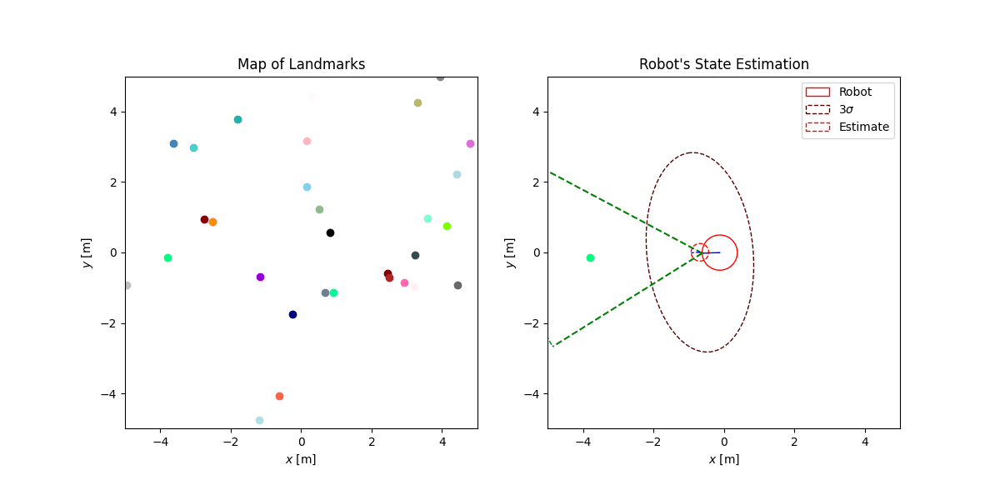

In [12]:
resetRobot()
ekf = initializeEkf()

dt = 0.05
animation_time = 20 #[s]

n_frames = int(animation_time / dt)
trajectory = generateRandomVelocityTrajectory(n_frames,dt)
applied_controls = []

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

landmark_map.draw(ax1)
ax1.set_aspect('equal', adjustable='box')
ax1.set_title("Map of Landmarks")
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")
#update function for animation
def update(frame):
    global applied_controls
    ax2.clear()
    
    u = trajectory[frame]

    applied_controls.append(robot.applyControl(u))

    sensor_readings = robot.getSensorReadings() 
    deteced_features = sensor_readings[0][0]
    correspondences = sensor_readings[0][1]
    
    ekf.predictOdometry(u)  
    ekf.predictUnknownCorrespondence(deteced_features, landmark_map)

    ax1.set_xlim(x_roi)
    ax1.set_ylim(y_roi)

    ax2.set_xlim(x_roi)
    ax2.set_ylim(y_roi)
    ax2.set_title("Robot's State Estimation")
    ax2.set_xlabel("$x$ [m]")
    ax2.set_ylabel("$y$ [m]")

    landmark_map.draw(ax2, correspondences=correspondences)
    robot.draw(ax2, label = "Robot")
    ekf.draw(ax2, n_sigmas=3, draw_all_sigma=False, draw_mu=False)
    
    pos = robot.pos
    robot.updatePosition(ekf.mu)
    robot.draw(ax2, label = "Estimate", linestyle='--', draw_sensor=False, r=0.25)
    robot.updatePosition(pos)
    

ani = FuncAnimation(fig, update, frames=np.arange(0, n_frames), interval=50)

gif_path = 'img/3/unknownCorr.gif'
ani.save(gif_path, writer='pillow', fps=20)

plt.close(fig)

display(Image(filename=gif_path))


---
#### **Velocity Trajectory Analysis**

This visualization compares the commanded velocities with the effectively applied velocities throughout the simulation:

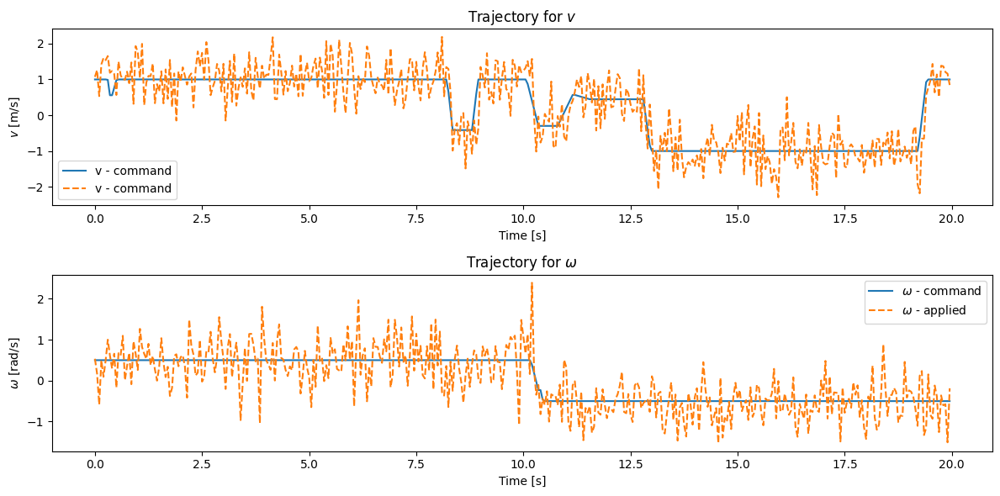

In [13]:
v_traj= []
w_traj = []
v_eff_traj = []
w_eff_traj = []
t_traj = []

t = 0
for u, u_eff in zip(trajectory, applied_controls):
    t_traj.append(t)
    v_traj.append(u.v)
    w_traj.append(u.w) 
    v_eff_traj.append(u_eff.v) 
    w_eff_traj.append(u_eff.w) 
    t += dt

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))
ax1.set_title("Trajectory for $v$")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel(r"$v$ [m/s]")

ax2.set_title("Trajectory for $\\omega$")
ax2.set_xlabel("Time [s]")
ax2.set_ylabel(r"$\omega$ [rad/s]")

ax1.plot(t_traj, v_traj, label="v - command")
ax1.plot(t_traj, v_eff_traj, linestyle='--', label="v - command")
ax1.legend()

ax2.plot(t_traj, w_traj, label="$\\omega$ - command")
ax2.plot(t_traj, w_eff_traj, linestyle='--', label="$\\omega$ - applied")
ax2.legend()
plt.tight_layout()


### UKF with Matched Correspondences

This section examines the **Unscented Kalman Filter (UKF)** implementation for robot localization when **landmark correspondences are known**. The UKF algorithm uses the signature of the detected feature and matches it to the corresponding landmark in the map, enabling precise data association.

To incorporate the measurements, two variants are used in the measurement correction step:
- **Average based measurement correction** (`variant = 'A'`)
- **Full measurement correction** (`variant = 'B'`)

---

#### **Average Measurement Correction**
The **average measurement correction** variant computes the expected measurement for each sigma point by averaging the readings from all detected landmarks.

#### Mathematical Formulation
For each sigma point $ \mathcal{X}_i $, the expected measurement $ \mathcal{Z}_i $ is computed as:
$$
\mathcal{Z}_i = {x}_z + \frac{1}{N} \sum_{j=1}^{N} \begin{bmatrix} r_j \\ \phi_j \end{bmatrix}
$$
where $ {x}_z $ is the noise component of the sigma point, $ N $ is the number of detected landmarks and $ r_j $ and $ \phi_j $ are the range and bearing measurements of the $ j $-th landmark, respectively.

---

#### **Full Measurement Correction**
The **full measurement correction** variant processes each detected landmark individually. For each sigma point, it computes the expected measurement for every detected landmark and constructs a full measurement vector.

#### Mathematical Formulation
For each sigma point $ \mathcal{X}_i $, the expected measurement $ \mathcal{Z}_i $ is constructed as a vector of range and bearing measurements for all detected landmarks:
$$
\mathcal{Z}_i = \begin{bmatrix} {z}_{i,1}\ \dots\ {z}_{i,N} \end{bmatrix}^T
$$
where $ {z}_{i,j} $ is the measurement for the $ j $-th landmark:
$$
{z}_{i,j} = \begin{bmatrix} r_j \\ \phi_j \end{bmatrix} + {x}_z
$$
with:

$$ 
r_j = \sqrt{(x_{l,j} - x_i)^2 + (y_{l,j} - y_i)^2} \\ \phi_j = \text{atan2}(y_{l,j} - y_i, x_{l,j} - x_i) - \theta_i
$$ 

for the position of the $ j $-th landmark  $ (x_{l,j}, y_{l,j}) $ and the pose of the $ i $-th sigma point $ (x_i, y_i, \theta_i) $. Note that $x_z$ corresponds to the slice in the augmented state  for the sensor data of a given sigma point 
$$
\mathcal{X} = \begin{bmatrix}x_\mu & x_u & x_z \end{bmatrix}
$$

---
#### **Correction of $\mu$ and $\Sigma$**

The predicted measurement $ \hat{{z}} $ is then computed as a weighted sum of the sigma point measurements:
$$
\hat{{z}} = \sum_{i=0}^{2L} W_i^{(m)} {z}_i
$$
where $ W_i^{(m)} $ are the mean weights of the UKF.

Before integrating the measurements in the prediction of the state $\mu$ and $\Sigma$, they are processed according to the chosen measurement correction variant, to ensure a compatible representation of the actual measurements with the predicted measurements.

The measurement covariance $ {S} $ and cross-covariance $ {\Sigma}_{xz} $ are computed as:
$$
{S} = \sum_{i=0}^{2L} W_i^{(c)} (\mathcal{Z}_i - \hat{{z}})(\mathcal{Z}_i - \hat{{z}})^T + {R}
$$
$$
{\Sigma}_{xz} = \sum_{i=0}^{2L} W_i^{(c)} (\mathcal{X}_i - \hat{{x}})(\mathcal{Z}_i - \hat{{z}})^T
$$
where:
- $ {R} $ is the measurement noise covariance.
- $ W_i^{(c)} $ are the covariance weights of the UKF.
- $ \hat{{x}} $ is the predicted state mean.

The state and covariance are updated using the Kalman gain $ {K} $:
$$
{K} = {\Sigma}_{xz} {S}^{-1}
$$
$$
\hat{\mu} \leftarrow \hat{\mu} + {K} ({z} - \hat{{z}})
$$
$$
{\Sigma} \leftarrow {\Sigma} - {K} {S} {K}^T
$$



In [14]:
dt = 0.1 #[s]
angular_velocity = -1 #[rad/s]
linear_velocity = 1 #[m/s]

u = VelocityControl(linear_velocity, angular_velocity, dt)



---

#### **UKF Prediction Steps: Visualization**

The following plots illustrate the UKF prediction process for a given control input, comparing the two variants:

- **1. Robot's Initial Position (`ax1`)** \
Shows the robot's starting pose together with the initial estimate and the landmark map.

- **2. Robot's Position After Command (`ax2`)** \
Compares the **expected** (noise-free) and **actual** (noisy) robot positions after applying a control input $\vec{u}$.

- **3. UKF Odometry Prediction (`ax3`)** \
Shows the robot's state after the **odometry-based prediction step** (no sensor data is considered at this stage).

- **4. UKF Prediction Refinement (`ax4`)**\
Shows the robot's state after incorporating **sensor readings** (i.e. the observed landmarks).\
**Note:** some of the landmarks in the sensor's FOV may remain undetected!




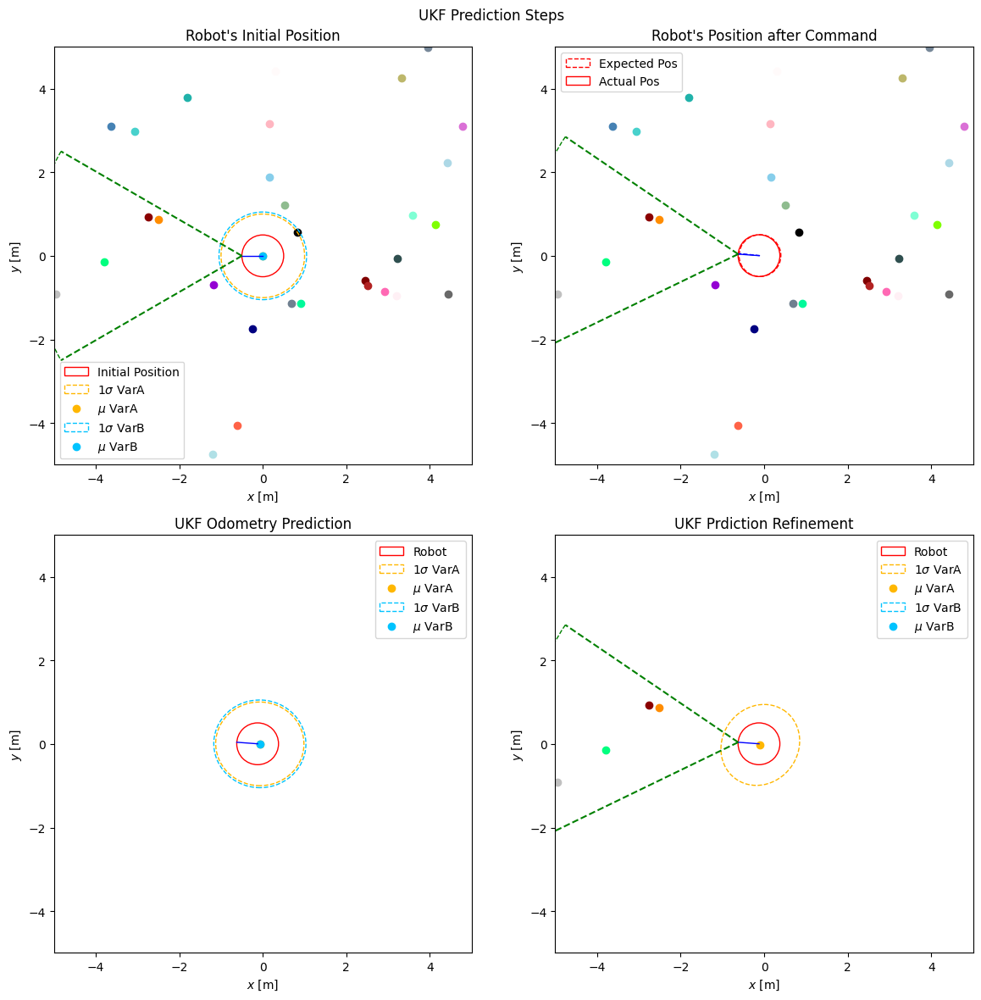

In [15]:
resetRobot()

ukf_varA = Ukf(robot.pos, np.array([[1, 0, 0],[0, 1, 0], [0, 0, 1]]))
ukf_varB = Ukf(robot.pos, np.array([[1.1, 0, 0],[0, 1.1, 0], [0, 0, 1.1]]))

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))
fig.suptitle("UKF Prediction Steps")

### --- AX1
ax1.set_title("Robot's Initial Position")
ax1.set_xlim(x_roi)
ax1.set_ylim(y_roi)
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")

landmark_map.draw(ax1)
robot.draw(ax1, label="Initial Position")
ukf_varA.draw(ax1, n_sigmas=1, label="VarA", color="#ffb700")
ukf_varB.draw(ax1, n_sigmas=1, label="VarB", color="#00c3ff")

### --- AX2
ax2.set_title("Robot's Position after Command")
ax2.set_xlim(x_roi)
ax2.set_ylim(y_roi)
ax2.set_xlabel("$x$ [m]")
ax2.set_ylabel("$y$ [m]")

landmark_map.draw(ax2)

robot.applyControl(u, motion_noise=False)
robot.draw(ax2, label="Expected Pos", linestyle='--', draw_sensor=False)

resetRobot()

robot.applyControl(u)
robot.draw(ax2, label="Actual Pos")
### --- AX3
ax3.set_title("UKF Odometry Prediction")
ax3.set_xlim(x_roi)
ax3.set_ylim(y_roi)
ax3.set_xlabel("$x$ [m]")
ax3.set_ylabel("$y$ [m]")

ukf_varA.predictOdometry(u, landmark_map)
ukf_varB.predictOdometry(u, landmark_map)

robot.draw(ax3, label="Robot", draw_sensor=False)
ukf_varA.draw(ax3, n_sigmas=1, label="VarA", color="#ffb700")
ukf_varB.draw(ax3, n_sigmas=1, label="VarB", color="#00c3ff")
### --- AX4
ax4.set_title("UKF Prdiction Refinement")
ax4.set_xlim(x_roi)
ax4.set_ylim(y_roi)
ax4.set_xlabel("$x$ [m]")
ax4.set_ylabel("$y$ [m]")

sensor_readings = robot.getSensorReadings() 
deteced_features = sensor_readings[0][0]
correspondences = sensor_readings[0][1]

ukf_varA.measurementCorrection(landmark_map, deteced_features, variant='A')
ukf_varB.measurementCorrection(landmark_map, deteced_features, variant='B')

landmark_map.draw(ax4, correspondences)
robot.draw(ax4, label="Robot")
ukf_varA.draw(ax4, n_sigmas=1, label="VarA", color="#ffb700")
ukf_varB.draw(ax4, n_sigmas=1, label="VarB", color="#00c3ff")

plt.tight_layout()


### Sigma Points Generation in UKF

In the **Unscented Kalman Filter (UKF)**, sigma points are used to approximate the probability distribution of the state. These points are propagated through the nonlinear system dynamics, allowing the UKF to capture the mean and covariance of the transformed state without linearization.

---

#### **Mathematical Formulation**

#### Augmented State and Covariance:
The UKF first constructs an **augmented state vector** and an **augmented covariance matrix** by combining the state, control input, and process noise:
$$
{\mu}_{\text{aug}} = \begin{bmatrix} {\mu} \\ {0} \\ {0} \end{bmatrix}, \quad
{\Sigma}_{\text{aug}} = \begin{bmatrix}
{\Sigma} & {0} & {0} \\
{0} & {M} & {0} \\
{0} & {0} & {Q}
\end{bmatrix}
$$
where ${\mu}$ is the mean of the state, ${\Sigma}$ is the state covariance, ${M}$ is the covariance of the control input noise and ${Q}$ is the process noise covariance.

#### Cholesky Decomposition:
The augmented covariance matrix ${\Sigma}_{\text{aug}}$ is decomposed using Cholesky factorization:
$$
{\Sigma}_{\text{aug}} = {U} {U}^T
$$
where ${U}$ is the lower triangular Cholesky factor.

**Note:** If the matrix is not positive definite, a small regularization term is added to ensure numerical stability.

#### Sigma Points Calculation:
The sigma points $\mathcal{X}_i$ are generated as follows:
$$
\mathcal{X}_0 = {\mu}_{\text{aug}}
$$
$$
\mathcal{X}_i = {\mu}_{\text{aug}} + \gamma {U}_i, \quad i = 1, \ldots, L
$$
$$
\mathcal{X}_{i+n} = {\mu}_{\text{aug}} - \gamma {U}_i, \quad i = 1, \ldots, L
$$
where $L$ is the dimension of the augmented state, $$\gamma = \sqrt{L + \lambda} \\ \lambda = \alpha^2 (L + \kappa) - L$$ are the scaling factor, and the composite scaling parameter respectively and ${U}_i$ is the $i$-th column of the Cholesky factor ${U}$.

#### Sigma Points Matrix:
The sigma points are arranged in a matrix ${X}$:
$$
{X} = \begin{bmatrix} \mathcal{X}_0 & \mathcal{X}_1 & \cdots & \mathcal{X}_{2L} \end{bmatrix}
$$
Each column of ${X}$ represents a sigma point.

In [16]:
dt = 1 #[s]
angular_velocity = 1 #[rad/s]
linear_velocity = 1 #[m/s]

u = VelocityControl(linear_velocity, angular_velocity, dt)


---

#### **UKF Sigma Points: Visualization**

The following plots visualize the **UKF prediction process** for a given control input:

- **1. Robot's Initial Position (`ax1`)** \
  Displays the robot's starting pose and the initial state estimate.

- **2. Robot's Position After Command (`ax2`)** \
  Shows pairs of sigma points (before and after applying the transfer function) in blue, connected by lines. The distribution derived from these sigma points is also visualized.

- **3. UKF Sigma Points (`ax3`)** \
  Compares the robot's actual position after the control input with the predicted position based on the computed sigma points.


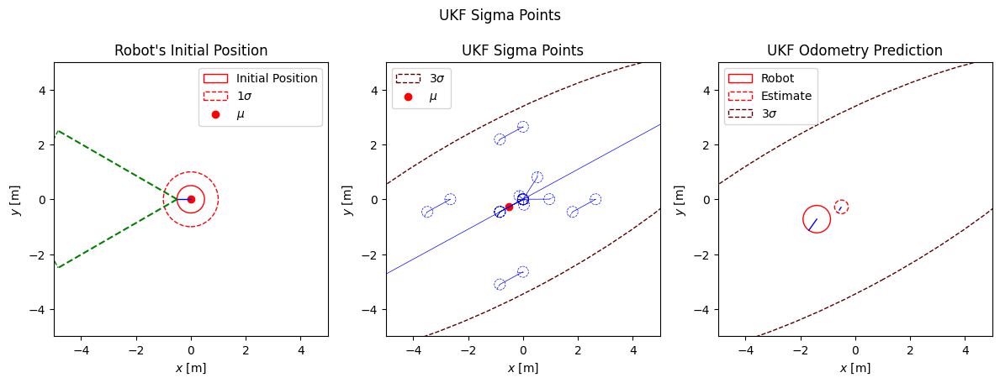

In [17]:
resetRobot()
ekf = initializeEkf()

ukf = Ukf(robot.pos, np.array([[1, 0, 0],[0, 1, 0], [0, 0, 1]]))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4.5))
fig.suptitle("UKF Sigma Points")

### --- AX1
ax1.set_title("Robot's Initial Position")
ax1.set_xlim(x_roi)
ax1.set_ylim(y_roi)
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")

robot.draw(ax1, label="Initial Position")
ukf.draw(ax1, n_sigmas=1)

### --- AX2
ax2.set_title("UKF Sigma Points")
ax2.set_xlim(x_roi)
ax2.set_ylim(y_roi)
ax2.set_xlabel("$x$ [m]")
ax2.set_ylabel("$y$ [m]")

ukf.predictOdometry(u, landmark_map, ax2)
ukf.draw(ax2, n_sigmas=3, draw_all_sigma=False)

### --- AX3
ax3.set_title("UKF Odometry Prediction")
ax3.set_xlim(x_roi)
ax3.set_ylim(y_roi)
ax3.set_xlabel("$x$ [m]")
ax3.set_ylabel("$y$ [m]")

robot.applyControl(u)
robot.draw(ax3, label="Robot", draw_sensor=False)
pos = robot.pos
robot.updatePosition(ukf.mu)
robot.draw(ax3, label = "Estimate", linestyle='--', draw_sensor=False, r=0.25, colors=["#0000ff","#ff0000"])
robot.updatePosition(pos)
ukf.draw(ax3, n_sigmas=3, draw_mu=False, draw_all_sigma=False)

plt.tight_layout()



---
#### **Robot Localization Animation**

This visualization demonstrates the Unscented Kalman Filter (UKF) in action. The robot follows a randomly generated trajectory. It compares the two variants' performance in localizing the robot.

From the animation the following observations can be made:
- The uncertainty increases with movement
- The uncertainty only decreases when a landmark is detected


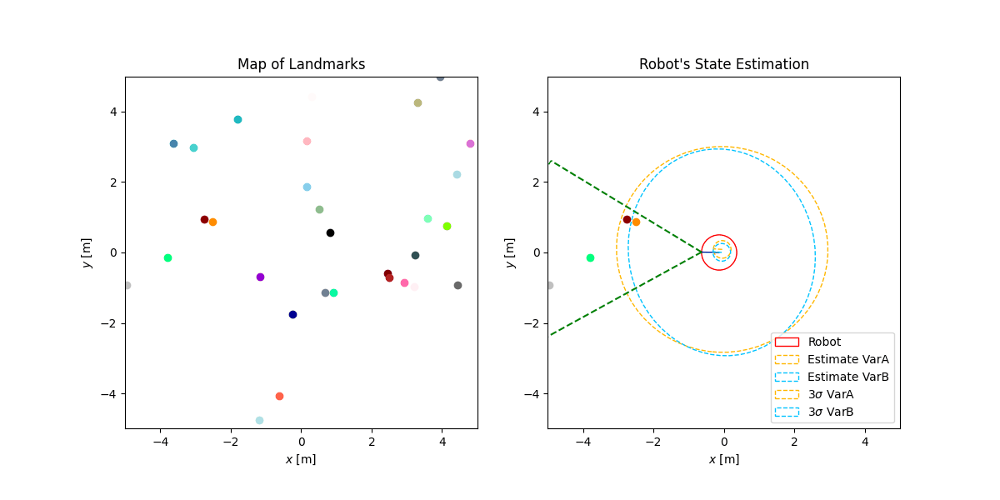

In [18]:
resetRobot()

ukf_varA = Ukf(robot.pos, np.array([[1,   0, 0],[0, 1,   0], [0, 0, 1  ]]), meas_noise = 2.5, coefs = [1, 1, 1, 1], q_mat = np.array([[5,0],[0,8]]))
ukf_varB = Ukf(robot.pos, np.array([[1.1, 0, 0],[0, 1.1, 0], [0, 0, 1.1]]), meas_noise = 2.5, coefs = [1, 1, 1, 1], q_mat = np.array([[5,0],[0,8]]))

dt = 0.05
animation_time = 20 #[s]

n_frames = int(animation_time / dt)
trajectory = generateRandomVelocityTrajectory(n_frames,dt)
applied_controls = []

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

landmark_map.draw(ax1)
ax1.set_aspect('equal', adjustable='box')
ax1.set_title("Map of Landmarks")
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")
#update function for animation
def update(frame):
    global applied_controls
    ax2.clear()
    
    u = trajectory[frame]

    applied_controls.append(robot.applyControl(u, motion_noise=True))

    sensor_readings = robot.getSensorReadings(detection_noise=True) 
    deteced_features = sensor_readings[0][0]
    correspondences = sensor_readings[0][1]

    ukf_varA.ukf(u, landmark_map, deteced_features, variant='A')
    ukf_varB.ukf(u, landmark_map, deteced_features, variant='B')
    
    ax1.set_xlim(x_roi)
    ax1.set_ylim(y_roi)

    ax2.set_xlim(x_roi)
    ax2.set_ylim(y_roi)
    ax2.set_title("Robot's State Estimation")
    ax2.set_xlabel("$x$ [m]")
    ax2.set_ylabel("$y$ [m]")

    landmark_map.draw(ax2, correspondences=correspondences)

    robot.draw(ax2, label = "Robot")
    
    pos = robot.pos
    robot.updatePosition(ukf_varA.mu)
    robot.draw(ax2, label = "Estimate VarA", linestyle='--', draw_sensor=False, r=0.25, colors=["#ffb700","#ffb700"])
    robot.updatePosition(ukf_varB.mu)
    robot.draw(ax2, label = "Estimate VarB", linestyle='--', draw_sensor=False, r=0.25, colors=["#00c3ff","#00c3ff"])
    robot.updatePosition(pos)
    
    ukf_varA.draw(ax2, n_sigmas=3, draw_all_sigma=False, draw_mu=False, label="VarA", color="#ffb700")
    ukf_varB.draw(ax2, n_sigmas=3, draw_all_sigma=False, draw_mu=False, label="VarB", color="#00c3ff")

ani = FuncAnimation(fig, update, frames=np.arange(0, n_frames), interval=50)

gif_path = 'img/3/ukf.gif'
ani.save(gif_path, writer='pillow', fps=20)

plt.close(fig)

display(Image(filename=gif_path))


---
#### **Velocity Trajectory Analysis**

This visualization compares the commanded velocities with the effectively applied velocities throughout the simulation:

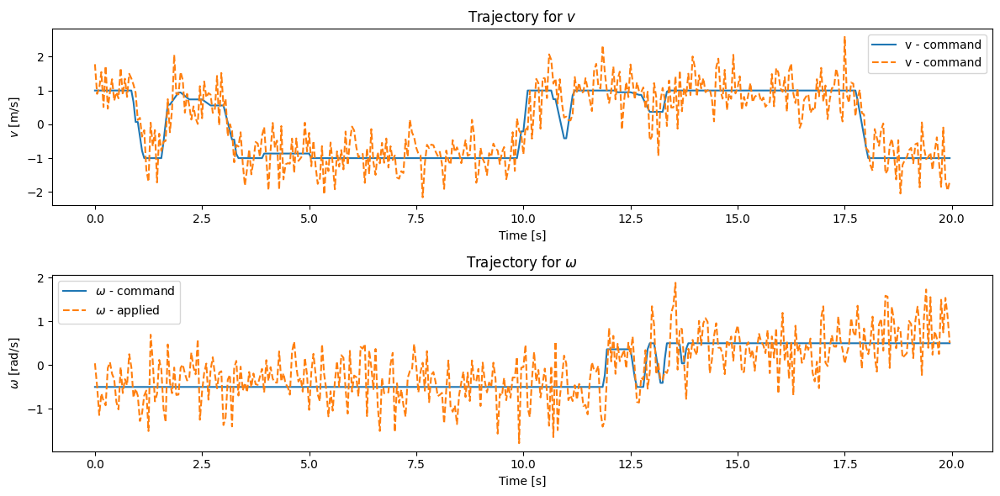

In [19]:
v_traj= []
w_traj = []
v_eff_traj = []
w_eff_traj = []
t_traj = []

t = 0
for u, u_eff in zip(trajectory, applied_controls):
    t_traj.append(t)
    v_traj.append(u.v)
    w_traj.append(u.w) 
    v_eff_traj.append(u_eff.v) 
    w_eff_traj.append(u_eff.w) 
    t += dt

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))
ax1.set_title("Trajectory for $v$")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel(r"$v$ [m/s]")

ax2.set_title("Trajectory for $\\omega$")
ax2.set_xlabel("Time [s]")
ax2.set_ylabel(r"$\omega$ [rad/s]")

ax1.plot(t_traj, v_traj, label="v - command")
ax1.plot(t_traj, v_eff_traj, linestyle='--', label="v - command")
ax1.legend()

ax2.plot(t_traj, w_traj, label="$\\omega$ - command")
ax2.plot(t_traj, w_eff_traj, linestyle='--', label="$\\omega$ - applied")
ax2.legend()
plt.tight_layout()
